In [0]:
!pip install fastai

In [0]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d katexu/trash_detection
!unzip trash_detection.zip
!rm -rf __MACOSX

In [0]:
from fastai.vision import *

In [0]:
#constants
bs = 64  #batch size: if your GPU is running out of memory, set a smaller batch size, i.e 16
sz = 224 #image size
path = Path('dataset-original')

In [17]:
path.ls()

[PosixPath('dataset-original/plastic'),
 PosixPath('dataset-original/paper'),
 PosixPath('dataset-original/trash'),
 PosixPath('dataset-original/metal'),
 PosixPath('dataset-original/glass'),
 PosixPath('dataset-original/cardboard')]

In [0]:
shutil.rmtree('dataset-backup/trash')
shutil.copytree('dataset-original/trash', 'dataset-backup/trash')
shutil.rmtree('dataset-original/trash')

In [32]:
path.ls()

[PosixPath('dataset-original/plastic'),
 PosixPath('dataset-original/paper'),
 PosixPath('dataset-original/metal'),
 PosixPath('dataset-original/glass'),
 PosixPath('dataset-original/cardboard')]

In [0]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2, 
                                  ds_tfms=get_transforms(), size=sz, num_workers=4).normalize(imagenet_stats)

In [34]:
print ("There are", len(data.train_ds), "training images and", len(data.valid_ds), "validation images." )

There are 1912 training images and 478 validation images.


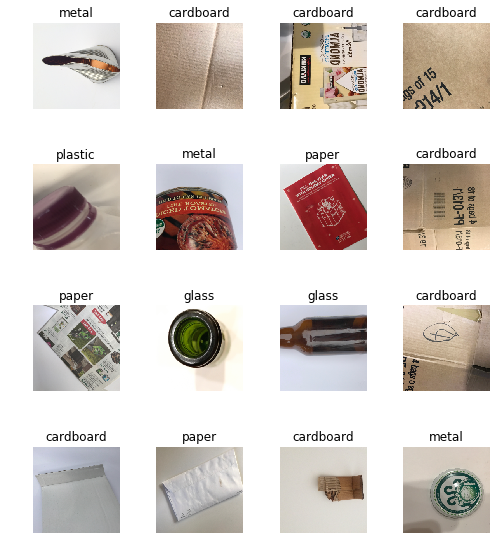

In [35]:
data.show_batch(rows=4, figsize=(7,8))

In [36]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['cardboard', 'glass', 'metal', 'paper', 'plastic'], 5, 1912, 478)

# Train model

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In [38]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.211826,0.411204,0.150628,11:20
1,0.753132,0.345590,0.133891,11:17
2,0.551171,0.306587,0.115063,11:15
3,0.438540,0.305511,0.108787,11:17


In [0]:
#save saves the model current parameters in case we may need to reload it later.
learn.save('stage-1')

In [0]:
learn.unfreeze()

In [41]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


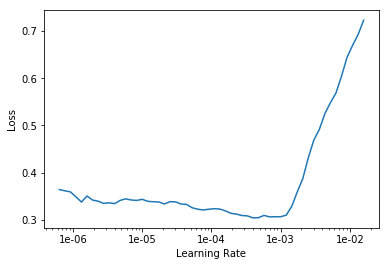

In [42]:
learn.recorder.plot()

In [43]:
learn.fit_one_cycle(4, max_lr=slice(1e-5,1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.317660,0.289688,0.110879,11:41
1,0.272989,0.258613,0.089958,11:41
2,0.216224,0.239207,0.081590,11:46
3,0.189795,0.234183,0.083682,11:36


In [0]:
learn.save('stage-2')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

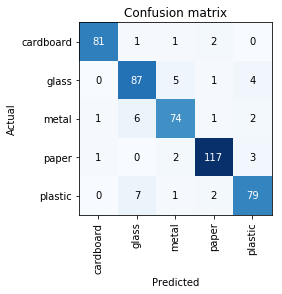

In [46]:
interp.plot_confusion_matrix()

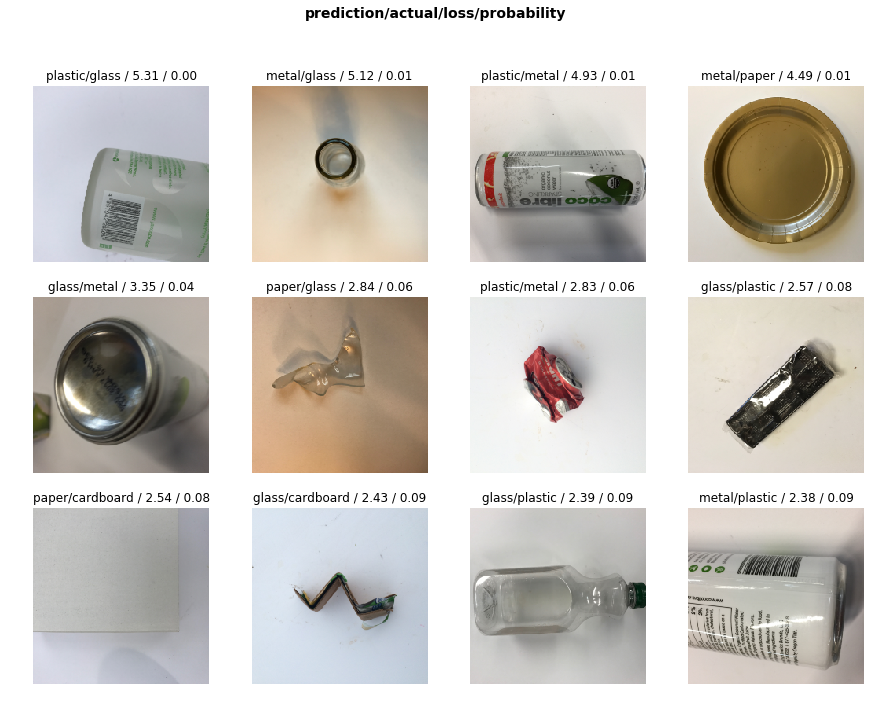

In [48]:
interp.plot_top_losses(12, figsize=(15,11), heatmap=False)

In [50]:
interp.most_confused(min_val=3)

[('plastic', 'glass', 7),
 ('metal', 'glass', 6),
 ('glass', 'metal', 5),
 ('glass', 'plastic', 4),
 ('paper', 'plastic', 3)]

# Predict

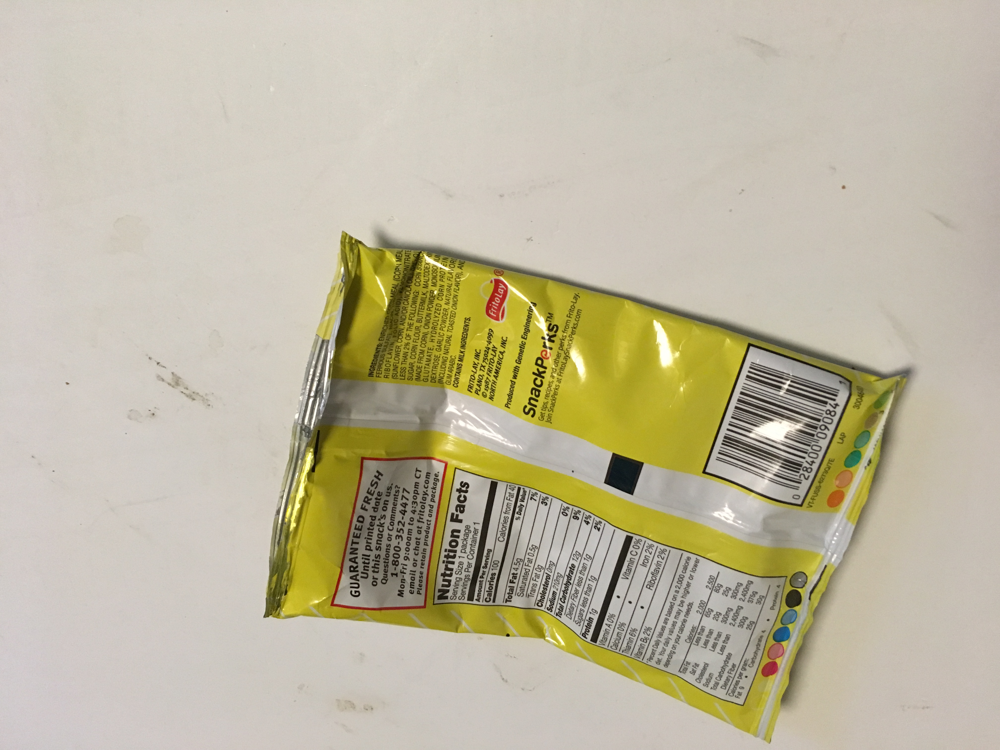

In [53]:
img = open_image('dataset-backup/trash/trash110.jpg')
img

In [54]:
learn.predict(img)

(Category plastic, tensor(4), tensor([0.0021, 0.0110, 0.3739, 0.0281, 0.5849]))